# Méthodes d'interprétation locales indépendantes du modèle 

Dans les deux chapitres précédents, nous avons traité exclusivement des méthodes d'interprétation globales. Ce chapitre fera une incursion dans les méthodes d'interprétation locales, qui sont là pour expliquer pourquoi une seule prédiction ou un groupe de prédictions a été faite. 

Il couvrira comment tirer parti de KernelExplainer de SHApley Additive ExPlanations (SHAP) et également, une autre méthode appelée Local Interpretable Model-agnostic Explanations (LIME) pour les interprétations locales. 


Nous explorerons également comment utiliser ces méthodes avec des données tabulaires et textuelles. Ce sont les principaux sujets que nous allons couvrir dans ce chapitre :

* Utilisation de KernelExplainer de SHAP pour les interprétations locales avec les valeurs SHAP

* Emploi de LIME 
* Utilisation de LIME pour le traitement du langage naturel (NLP)

## La mission

Qui n'aime pas le chocolat ?! C'est un favori mondial, avec environ neuf personnes sur dix l'aimant et environ un milliard de personnes en mangeant chaque jour. Une forme populaire sous laquelle il est consommé est sous forme de barre de chocolat. Cependant, même des ingrédients universellement appréciés peuvent être utilisés de manières qui ne sont pas universellement attrayantes. Ainsi, les barres de chocolat peuvent aller du sublime au médiocre, voire carrément désagréable. 


Souvent, cela est uniquement déterminé par la qualité du cacao ou des ingrédients supplémentaires, et parfois cela devient un goût acquis une fois qu'il est associé à des saveurs exotiques. 


Un chocolatier français obsédé par l'excellence vous a contacté. Ils ont un problème. Tous leurs bars ont été très bien notés par les critiques, mais les critiques ont des papilles gustatives très particulières. Et certains bars qu'ils aiment ont des ventes inexplicablement médiocres, mais les non-critiques semblent les apprécier dans les groupes de discussion et les dégustations, ils sont donc perplexes quant au fait que les ventes ne coïncident pas avec leurs études de marché. 

Ils ont trouvé un ensemble de données de barres chocolatées évaluées par des amateurs avertis de chocolat, et ces évaluations coïncident avec leurs ventes. Pour obtenir un avis impartial, ils ont sollicité votre expertise. En ce qui concerne l'ensemble de données, les membres de la Manhattan Chocolate Society se réunissent depuis 2007 dans le seul but de goûter et de juger le chocolat, d'éduquer les consommateurs et d'inspirer les chocolatiers à produire plus -chocolat de qualité. Depuis lors, ils ont compilé un ensemble de données de plus de 2 200 barres de chocolat, évalué par leurs membres selon l'échelle suivante :

* 4,0 - 5,00 = Exceptionnel
* 3,5 - 3,99 = Hautement recommandé
* 3,0 - 3,49 = Recommandé
* 2,0 - 2,99 = Décevant
* 1,0 - 1,90 = Désagréable

Ces notes sont dérivées d'une rubrique qui prend en compte l'arôme, l'apparence, la texture, la saveur, l'aert-goût et l'opinion générale, et les barres notées sont pour la plupart des barres de chocolat plus foncées depuis le but est d'apprécier les saveurs du cacao. En plus des notes, l'ensemble de données de la Manhattan Chocolate Society comprend de nombreuses caractéristiques, telles que le pays où la fève de cacao a été cultivée, le nombre d'ingrédients de la barre, si elle contient du sel et les mots utilisés pour la décrire. 

L'objectif est de comprendre pourquoi l'une des barres chocolatées est notée Exceptionnelle mais se vend mal, tandis qu'une autre, dont les ventes sont impressionnantes, est notée Décevant

## L'approche

Vous avez décidé d'utiliser l'interprétation du modèle local pour expliquer pourquoi chaque barre est notée telle quelle. À cette fin, vous préparerez l'ensemble de données, puis entraînerez des modèles de classification pour prédire si les notes des barres chocolatées sont supérieures ou égales à Hautement recommandé, car le client souhaite que toutes ses barres tombent au-dessus de ce seuil. 

Vous devrez entraîner deux modèles : un pour les données tabulaires et un autre pour la PNL pour les mots utilisés pour décrire les barres de chocolat. 

Nous utiliserons respectivement des machines à vecteurs de support (SVM) et des Light Gradient Boosting Machine (LightGBM) pour ces tâches. Si vous n'avez pas utilisé ces modèles de boîtes noires, pas de soucis, nous vous les expliquerons brièvement. Une fois que vous avez entraîné les modèles, vient la partie amusante : utilisez deux méthodes d'interprétation locales indépendantes des modèles pour comprendre ce qui fait qu'une barre de chocolat spécifique est inférieure ou non à Fortement recommandé. 

Ces méthodes sont SHAP et LIME, qui, une fois combinées, fourniront une explication plus riche à transmettre à votre client. Ensuite, nous comparerons les deux méthodes pour comprendre leurs forces et leurs limites.

In [ ]:
!pip install --upgrade machine-learning-datasets
!pip install --upgrade shap lime

     |████████████████████████████████| 312 kB 19.2 MB/s 
     |████████████████████████████████| 165 kB 48.3 MB/s 
     |████████████████████████████████| 7.1 MB 45.9 MB/s 
     |████████████████████████████████| 60.3 MB 53 kB/s 
     |████████████████████████████████| 394.5 MB 40 kB/s 
     |████████████████████████████████| 49 kB 5.3 MB/s 
     |████████████████████████████████| 28.0 MB 1.3 MB/s 
     |████████████████████████████████| 3.8 MB 43.9 MB/s 
     |████████████████████████████████| 2.9 MB 39.3 MB/s 
     |████████████████████████████████| 462 kB 41.3 MB/s 
  Created wheel for pycebox: filename=pycebox-0.0.1-py3-none-any.whl size=3639 sha256=c0d189bafd0a5301d4c121b898d15268ec6b6ecf1cc3c011bef83059b1de8ad1
  Stored in directory: /root/.cache/pip/wheels/cc/0d/0a/06236a41d8f5c3485c1057262de55329e227a0c239fd00d0cd
  Created wheel for spacy-lookups-data: filename=spacy_lookups_data-0.1.0-py2.py3-none-any.whl size=28052157 sha256=6bf60457ec91055bffde75b1584db9bedcf94c7345aa5ae7f

In [ ]:
import math
import machine_learning_datasets as mldatasets
import pandas as pd
import numpy as np
import re
import nltk
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn import metrics, svm
from sklearn.feature_extraction.text import TfidfVectorizer
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from lime.lime_text import LimeTextExplainer

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.


Vous devrez également vous assurer que les mots vides et le tokenizer punkt sont téléchargés avant de les charger, comme ceci :

In [ ]:
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


## Comprendre et préparer les données

Nous chargeons les données dans un dataframe que nous appelons chocolateratings_df, comme ceci :

In [ ]:
chocolateratings_df = mldatasets.load("chocolate-bar-ratings")

https://github.com/PacktPublishing/Interpretable-Machine-Learning-with-Python/raw/master/datasets/chocolate-ratings.zip downloaded to /content/data/chocolate-ratings.zip
/content/data/chocolate-ratings.zip uncompressed to /content/data/chocolate-ratings
1 dataset files found in /content/data/chocolate-ratings folder
parsing /content/data/chocolate-ratings/chocolate.csv


Il devrait y avoir plus de 2 200 enregistrements et 18 colonnes. Nous pouvons vérifier que c'était le cas simplement en inspectant le contenu de la trame de données, comme ceci :

In [ ]:
chocolateratings_df

,company,company_location,review_date,country_of_bean_origin,cocoa_percent,rating,counts_of_ingredients,beans,cocoa_butter,vanilla,lecithin,salt,sugar,sweetener_without_sugar,first_taste,second_taste,third_taste,fourth_taste
0,5150,U.S.A,2019,Madagascar,76.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,blackberry,full body,NaN
1,5150,U.S.A,2019,Dominican republic,76.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,cocoa,vegetal,savory,NaN
2,5150,U.S.A,2019,Tanzania,76.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,rich cocoa,fatty,bready,NaN
3,A. Morin,France,2012,Peru,63.0,3.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fruity,melon,roasty,NaN
4,A. Morin,France,2012,Bolivia,70.0,3.50,4,have_bean,have_cocoa_butter,have_not_vanila,have_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,vegetal,nutty,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,Zotter,Austria,2014,Blend,80.0,2.75,4,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_salt,have_not_sugar,have_sweetener_without_sugar,waxy,cloying,vegetal,NaN
2220,Zotter,Austria,2017,Colombia,75.0,3.75,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,strong nutty,marshmallow,NaN,NaN
2221,Zotter,Austria,2018,Belize,72.0,3.50,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,muted,roasty,accessible,NaN
2222,Zotter,Austria,2018,Congo,70.0,3.25,3,have_bean,have_cocoa_butter,have_not_vanila,have_not_lecithin,have_not_salt,have_sugar,have_not_sweetener_without_sugar,fatty,mild nuts,mild fruit,NaN


## Le dictionnaire de données
Le dictionnaire de données comprend les éléments suivants :

* company : catégorielle ; le fabricant de la barre chocolatée (sur plus de 500 diffiérents)
* company_location : Catégorique ; pays du fabricant (66 pays diffiérents)

* review_date : continu ; année au cours de laquelle la barre a été révisée (de 2006 à 2020)
* country_of_bean_origin : catégorique ; pays où les fèves de cacao ont été récoltées (62 pays diffiérents)

* cocoa_percent : catégorique ; quel pourcentage de la barre représente le cacao

* rating : continue ; note attribuée par la Manhattan Chocolate Society (valeurs possibles : 1-5)

* counts_of_ingredients : continu ; quantité d'ingrédients dans la barre

* beans : Binaire ; était-il fait avec des fèves de cacao ? (have_bean ou have_not_bean)
* cacao_butter : binaire ; était-il fait avec du beurre de cacao ? (have_cocoa_butter ou have_not_cocoa_butter)

* vanilla : binaire ; est-ce fait avec de la vanille ? (have_vanilla ou have_not_vanilla)

* lecithin : binaire ; était-il fait avec de la lécithine ? (have_lecithin ou have_not_lecithin)

* salt : binaire ; était-il fait avec du sel ? (have_salt ou have_not_salt)

* sugar : binaire ; était-il fait avec du sucre ? (have_sugar ou have_not_sugar)• sweetener_without_sugar : binaire ; était-il fait avec édulcorant sans sucre ? (have_sweetener_without_sugar ou have_not_sweetener_without_sugar)
* first_taste : Texte ; mot(s) utilisé(s) pour décrire le premier goût
* second_taste : Texte ; mot(s) utilisé(s) pour décrire le deuxième goût
* third_taste : Texte ; mot(s) utilisé(s) pour décrire le troisième goût
* quatrième_goût : texte ; mot(s) utilisé(s) pour décrire le quatrième goût


Maintenant que nous avons jeté un coup d'œil aux données, nous pouvons rapidement préparer cela, puis travailler sur la modélisation et l'interprétation !

## Préparation des données
La première chose que nous devons faire est de mettre de côté les caractéristiques du texte afin de pouvoir les traiter séparément. Nous pouvons commencer par créer un cadre de données appelé tastes_df avec eux, puis les déposer de chocolateratings_df. Nous pouvons ensuite jeter un œil à tastes_df à l'aide de head and tail, comme illustré dans l'extrait de code suivant :

In [ ]:
tastes_df = chocolateratings_df[['first_taste', 'second_taste', 'third_taste', 'fourth_taste']]
chocolateratings_df = chocolateratings_df.\
                    drop(['first_taste', 'second_taste', 'third_taste', 'fourth_taste'], axis=1)
tastes_df.head(90).tail(10)

,first_taste,second_taste,third_taste,fourth_taste
80,oily,vegetal,nutty,cocoa
81,oily,vanilla,melon,cocoa
82,rich,sour,mild smoke,NaN
83,fruity,sour,NaN,NaN
84,high roast,high astringnet,NaN,NaN
85,smokey,savory,NaN,NaN
86,sandy,roasty,nutty,NaN
87,roasty,brownie,nutty,NaN
88,red wine,rich cocoa,long,NaN
89,creamy,fruit,cocoa,NaN


Maintenant, codons catégoriquement les caractéristiques catégorielles. Il y a trop de pays dans company_location et country_of_bean_origin, établissons donc un seuil. Supposons que s'il y a moins de 3,333 % (ou 74 lignes) pour un pays, regroupons-le dans une autre catégorie, puis codons les catégories. Nous pouvons facilement le faire avec la fonction make_dummies_with_limits que nous avons utilisée dans le chapitre précédent et le processus est à nouveau montré dans l'extrait de code suivant

In [ ]:
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'company_location', 0.03333)
chocolateratings_df = mldatasets.make_dummies_with_limits(chocolateratings_df,\
                                        'country_of_bean_origin', 0.03333)

Toutes les fonctionnalités binaires doivent être transformées en 1 et en 0 à l'exception des beans, qui ont toujours la même valeur (have_bean), en utilisant le code suivant :

In [ ]:
chocolateratings_df = chocolateratings_df.\
                                drop(['beans'], axis=1)
binary_features = ['cocoa_butter', 'vanilla', 'lecithin', 'salt',\
                   'sugar', 'sweetener_without_sugar']
chocolateratings_df[binary_features] =\
    chocolateratings_df[binary_features].\
        apply(lambda x: np.where(x.str.contains('_not_'), 0, 1))

Maintenant, pour traiter le contenu de tastes_df, nous devons noter que ce que nous aimerions idéalement voir, ce sont principalement des adjectifs qui signifient - ou au moins évoquent - un goût. Par conséquent, les mots vides, qui sont des mots courants tels que et, de et avec, peuvent être supprimés en toute sécurité, nous aurions donc besoin de charger une liste de mots vides anglais à partir de nltk, comme suit

In [ ]:
stop = stopwords.words('english')

Si vous examinez le contenu de tastes_df, vous trouverez d'autres éléments qui peuvent ajouter du bruit à un modèle en plus des mots vides. Vous trouverez des signes de ponctuation tels que &, des adverbes tels que overly, des fautes d'orthographe telles que astringnet et même des combinaisons adjectif-nom telles que full body. Ceux-ci peuvent être supprimés ou remplacés par un seul adjectif. Nous pouvons utiliser des expressions régulières pour ce faire, le tout d'un seul coup. À cette fin, créons d'abord un dictionnaire (trans_dict) avec nos remplacements et compilons-les dans une expression régulière, comme suit

In [ ]:
trans_dict = {'?':'', '&':'', 'overly intense':'intensest',\
              'overly sweet':'sweetest', 'overly tart':'tartest',\
              'sl. bitter':'bitterness', 'sl. burnt':'burntness',\
              'sl. sweet':'sweetness', 'sl. dry':'dryness',\
              'sl. chalky':'chalkiness', 'sl. Burnt':'burntness',\
              'hints fruit':'fruitiness', 'hint fruit':'fruitiness',\
              'high acid':'acidic', 'high acidity':'acidic',\
              'moderate acidity':'acid', 'high roast':'roast',\
              'astringcy':'astringent', 'astringnet':'astringent',\
              'full body':'robust', 'astringency':'astringent',\
              'high astringent':'acidic', 'rich cocoa':'rich',\
              'mild bitter':'bitterish', 'fruit long':'fruit',\
              'base cocoa':'basic', 'basic cocoa':'basic', '-like':'',\
              'smomkey':'smokey', 'true':'real', '(n)':'', '/':' ',\
              '-':' ', ' +':' ' }
trans_regex = re.compile("|".join(map(re.escape, trans_dict.keys( ))))

Le code suivant remplace toutes les valeurs nulles par des chaînes vides, puis joint toutes les colonnes de tastes_df ensemble, formant une seule série. Ensuite, il supprime les espaces blancs de début et de fin et convertit tout le texte en minuscules. Il a deux instances de apply : la première faisant tous les remplacements d'expressions régulières et la seconde supprimant les mots vides. Le code est illustré dans l'extrait suivant

In [ ]:
tastes_s = tastes_df.replace(np.nan, '', regex=True).\
            agg(' '.join, axis=1).str.strip().str.lower().\
            apply(lambda s: trans_regex.sub(lambda match:\
                                trans_dict[match.group(0)], s)).\
            apply(lambda s: ' '.join([word for word in s.split()\
                                      if word not in (stop)]))

Et voilà ! Vous pouvez vérifier que le résultat est une série de pandas (tastes_s) avec (principalement) des adjectifs liés au goût, comme ceci :

In [ ]:
print(tastes_s)

0          cocoa blackberry robust
1             cocoa vegetal savory
2                rich fatty bready
3              fruity melon roasty
4                    vegetal nutty
                   ...            
2219          waxy cloying vegetal
2220      strong nutty marshmallow
2221       muted roasty accessible
2222    fatty mild nuts mild fruit
2223            fatty earthy cocoa
Length: 2224, dtype: object


Comme prévu, cette série a la même longueur que la trame de données chocolateratings_df

Mais découvrons combien de ses phrases sont uniques, avec le code suivant :

In [ ]:
print(np.unique(tastes_s).shape)

(2178,)


Nous pouvons dire à partir de la sortie suivante que moins de 50 phrases sont dupliquées, donc la tokenisation par phrases serait une mauvaise idée

Il existe de nombreuses approches que vous pouvez adopter ici, telles que la tokenisation par des bi-grammes (séquences de deux mots) ou même des sous-mots (diviser les mots en parties logiques). Cependant, même si l'ordre importe légèrement (parce que les premiers mots avaient à voir avec le premier goût, et ainsi de suite), notre ensemble de données est trop petit et avait trop de valeurs nulles (en particulier dans le troisième goût et le quatrième goût) pour en tirer un sens. l'ordre. C'est pourquoi c'était un bon choix de concaténer tous les "goûts" ensemble, supprimant ainsi leur division discernable


Une autre chose à noter est que nos mots sont (principalement) des adjectifs. Nous avons fait un petit effort pour supprimer les adverbes, mais il y a encore quelques noms présents, tels que "fruit" et "noix", par rapport à des adjectifs tels que "fruité" et "noix". Nous ne pouvons pas être sûrs si les connaisseurs de chocolat qui ont jugé les barres voulaient dire quelque chose de différent en utilisant « fruit » plutôt que « fruité ». Cependant, si nous en étions sûrs, nous aurions pu effectuer un radicalisme ou une lemmatisation pour transformer toutes les instances de « fruit », « fruité » et « fruité » en un « fru » (tige) ou un « fruiti » (lemme) cohérent. Nous ne nous en préoccuperons pas car bon nombre de nos variantes d'adjectifs ne sont de toute façon pas aussi courantes dans les phrases. Cherchons les mots les plus courants en les tokenisant d'abord avec word_tokenize et en utilisant FreqDist pour compter leur fréquence. Nous pouvons ensuite placer le dictionnaire tastewords_fdist résultant dans une base de données (tastewords_df). Nous ne pouvons enregistrer que les mots avec plus de 74 instances sous forme de liste (commontastes_l). Le code est illustré dans l'extrait suivant

In [ ]:
tastewords_fdist = FreqDist(word for word in\
                            word_tokenize(tastes_s.str.cat(sep=' ')))
tastewords_df = pd.DataFrame.from_dict(tastewords_fdist,\
                                       orient='index').\
                                rename(columns={0:'freq'})
commontastes_l = tastewords_df[tastewords_df.freq > 74].index.to_list()
print(commontastes_l)

['cocoa', 'rich', 'fatty', 'roasty', 'nutty', 'sweet', 'sandy', 'sour', 'intense', 'mild', 'fruit', 'sticky', 'earthy', 'spice', 'molasses', 'floral', 'spicy', 'woody', 'coffee', 'berry', 'vanilla', 'creamy']


Comme vous pouvez le constater à partir de la sortie suivante pour commontastes_l, les mots les plus courants sont pour la plupart différents (à l'exception spice et spicy)

Une chose que nous pouvons faire avec cette liste pour améliorer notre ensemble de données tabulaires est de transformer ces mots courants en caractéristiques binaires. Autrement dit, il y aurait une colonne pour chacun de ces "goûts communs" (commontastes_l), et si les "goûts" pour la barre chocolatée l'incluaient, la colonne aurait un 1, sinon un 0. Heureusement, on peut le faire facilement avec deux lignes de code. Tout d'abord, nous créons une nouvelle colonne avec notre série de goûts de texte (tastes_s). ensuite, nous utilisons la fonction make_dummies_from_dict que nous avons utilisée dans le dernier chapitre pour générer les fonctionnalités factices en recherchant chaque "goût commun" dans le contenu de notre nouvelle colonne, comme suit

In [ ]:
chocolateratings_df['tastes'] = tastes_s
chocolateratings_df = mldatasets.make_dummies_from_dict(chocolateratings_df,\
                                             'tastes', commontastes_l)

Maintenant que nous avons terminé avec notre ingénierie des fonctionnalités, nous pouvons utiliser info() pour examiner notre dataframe, comme ceci

In [ ]:
chocolateratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2224 entries, 0 to 2223
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   company                                    2224 non-null   object 
 1   review_date                                2224 non-null   int64  
 2   cocoa_percent                              2224 non-null   float64
 3   rating                                     2224 non-null   float64
 4   counts_of_ingredients                      2224 non-null   int64  
 5   cocoa_butter                               2224 non-null   int64  
 6   vanilla                                    2224 non-null   int64  
 7   lecithin                                   2224 non-null   int64  
 8   salt                                       2224 non-null   int64  
 9   sugar                                      2224 non-null   int64  
 10  sweetener_without_sugar 

La sortie a toutes les caractéristiques numériques non nulles, à l'exception de la société. Il y a plus de 500 entreprises, donc l'encodage catégorique de cette fonctionnalité serait compliqué et, comme il serait conseillé de classer la plupart des entreprises comme Autre, cela introduirait probablement un biais en faveur des quelques entreprises les plus représentées. Par conséquent, il est préférable de supprimer complètement cette colonne.


Notre dernière étape pour préparer les données pour la modélisation commence par l'initialisation de rand, une constante qui nous servira d'"état aléatoire" tout au long de cet exercice. Ensuite, nous définissons y comme la colonne de notation convertie en 1 si elle est supérieure ou égale à 3,5, et en 0 sinon. X est tout le reste (hors entreprise). Ensuite, nous avons divisé X et y en ensembles de données d'entraînement et de test avec train_test_split, comme illustré dans l'extrait de code suivant

In [ ]:
rand = 9
y = chocolateratings_df['rating'].\
                            apply(lambda x: 1 if x >= 3.5 else 0)
X = chocolateratings_df.drop(['rating','company'], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(X, y,\
                                test_size=0.33, random_state=rand)

En plus des ensembles de données de test et d'entraînement tabulaires, pour nos modèles NLP, nous aurons besoin d'ensembles de données d'entités en texte uniquement qui sont cohérents avec notre train_test_split afin que nous puissions utiliser les mêmes étiquettes y. À cette fin, nous pouvons le faire en sous-divisant nos séries de goûts (tastes_s), en utilisant l'index de nos ensembles X_train et X_test pour produire des versions spécifiques à la PNL de la série, comme suit

In [ ]:
X_train_nlp = tastes_s[X_train.index]
X_test_nlp = tastes_s[X_test.index]

## Tirer parti de KernelExplainer de SHAP pour des interprétations locales avec des valeurs SHAP Pour cette section, et pour une utilisation ultérieure

nous allons d'abord former un modèle de classeur de vecteur de support (SVC)

## Entraîner un modèle C-SVC

SVM est une famille de classes de modèles qui opèrent dans un espace de grande dimension pour trouver un hyperplan optimal, où elles tentent de séparer les classes avec la marge maximale entre elles. 

Les vecteurs de support sont les points les plus proches de la limite de décision (l'hyperplan de division) qui la modifierait s'il était supprimé. Pour trouver le meilleur hyperplan, ils utilisent une fonction de coût appelée perte de charnière et une méthode peu coûteuse en calcul pour fonctionner dans un espace de grande dimension, appelée l'astuce du noyau, et même si un hyperplan suggère une séparabilité linéaire, il n'est pas toujours limité à un noyau linéaire. 

L'implémentation scikit-learn que nous utiliserons s'appelle C-SVC. SVC utilise un paramètre de régularisation L2 appelé C et, par défaut, utilise un noyau appelé fonction de base radiale (RBF), qui est décidément non linéaire. Pour un RBF, un hyperparamètre gamma dénit le rayon d'influence de chaque exemple d'apprentissage dans le noyau, mais de façon inversement proportionnelle. 

Par conséquent, une valeur faible augmente le rayon, tandis qu'une valeur élevée le diminue. 


La famille SVM comprend plusieurs variantes pour la classification et même les classes de régression via la régression à vecteur de support (SVR). L'avantage le plus important des modèles SVM est qu'ils ont tendance à fonctionner de manière efficace lorsqu'il y a beaucoup de caractéristiques par rapport aux observations, et même lorsque les caractéristiques dépassent les observations !

 Il a également tendance à trouver des relations non linéaires latentes dans les données, sans les surcharger ni devenir instables. Cependant, SVM n'est pas aussi évolutif pour des ensembles de données plus volumineux et il est difficile d'ajuster ses hyperparamètres. Étant donné que nous utiliserons le style de tracé Seaborn, qui est activé avec set(), pour certains des tracés de ce chapitre, nous allons d'abord enregistrer le matplotlib d'origine paramètres (rcParams) afin que nous puissions les restaurer plus tard. Une chose à noter à propos de SVC est qu'il ne produit pas nativement de probabilités puisqu'il s'agit d'algèbre linéaire. Cependant, si probabilité=True, l'implémentation de scikit-learn utilise une validation croisée, puis applique un modèle de régression logistique aux scores du SVC pour produire les probabilités. Nous utilisons également gamma=auto, ce qui signifie qu'il est défini sur 1/# fonctionnalités, donc 1/44. Comme toujours, il est recommandé de définir votre paramètre random_state pour la reproductibilité. Une fois que nous avons adapté le modèle aux données d'entraînement, nous pouvons utiliser evaluation_class_mdl pour évaluer les performances prédictives de notre modèle, comme illustré dans l'extrait de code suivant :

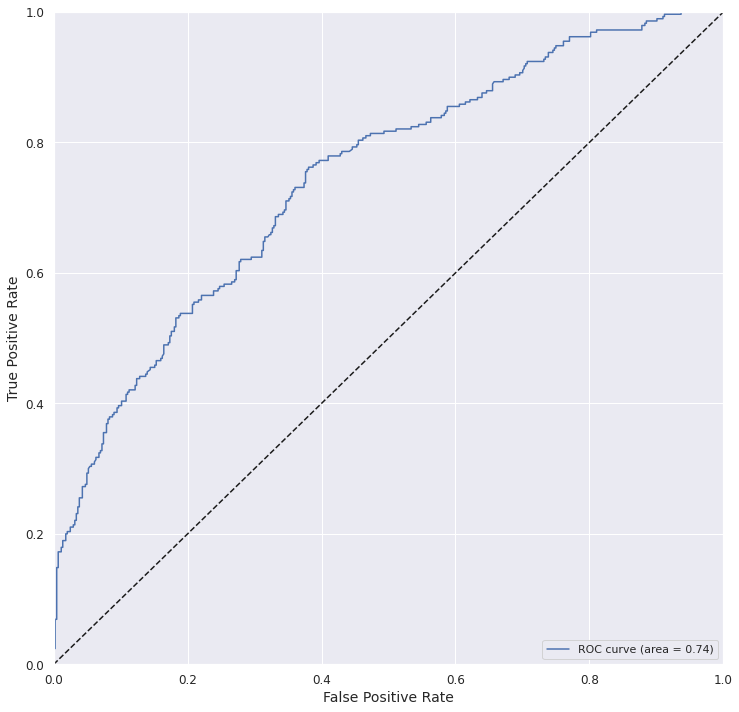

Accuracy_train:  0.7315		Accuracy_test:   0.6975
Precision_test:  0.6771		Recall_test:     0.4483
ROC-AUC_test:    0.7450		F1_test:         0.5394		MCC_test: 0.3433


In [ ]:
orig_plt_params = plt.rcParams
sns.set()
svm_mdl = svm.SVC(probability=True, gamma='auto', random_state=rand)
fitted_svm_mdl = svm_mdl.fit(X_train, y_train)
y_train_svc_pred, y_test_svc_prob, y_test_svc_pred =\
        mldatasets.evaluate_class_mdl(fitted_svm_mdl, X_train,\
                                      X_test, y_train, y_test)

Les performances obtenues (voir la figure) ne sont pas mauvaises, étant donné qu'il s'agit d'un petit ensemble de données déséquilibré dans un domaine déjà difficile pour les évaluations des utilisateurs des modèles d'apprentissage automatique. Dans tous les cas, la courbe de l'aire sous la courbe (AUC) est au-dessus de la ligne de tirage au sort en pointillé, et le coefficient de corrélation de Matthews (MCC) est sans danger au-dessus de 0. Plus important encore, la précision est nettement supérieure au rappel, et c'est très bon étant donné le coût hypothétique d'une mauvaise classification d'une barre de chocolat moche comme hautement recommandée. Nous privilégions la précision au rappel car nous préférerions avoir moins de faux positifs que de faux négatifs

## Calcul des valeurs SHAP à l'aide de KernelExplainer

Compte tenu de l'intensité du calcul des valeurs SHAP par force brute, la bibliothèque SHAP utilise de nombreux raccourcis statistiquement valides. Comme nous l'avons appris au chapitre 5, Méthodes d'interprétation globales indépendantes du modèle, ces raccourcis vont de l'exploitation de la structure d'un arbre de décision (TreeExplainer) à la différence dans les activations d'un réseau de neurones, et une ligne de base (DeepExplainer) au gradient d'un réseau de neurones (GradientExplainer ). Ces raccourcis rendent les explicateurs considérablement moins agnostiques de modèle puisqu'ils sont limités à une famille de classes de modèles. Cependant, il existe un explicateur véritablement indépendant du modèle dans SHAP, appelé KernelExplainer


KernelExplainer a deux raccourcis : il échantillonne un sous-ensemble de toutes les permutations de caractéristiques pour les coalitions et utilise un schéma de pondération en fonction de la taille de la coalition pour calculer les valeurs SHAP. Le premier raccourci est une technique recommandée pour réduire le temps de calcul. Le second est tiré du schéma de pondération de LIME, que nous aborderons ensuite dans ce chapitre, et les auteurs de SHAP l'ont fait pour qu'il reste conforme à Shapley. 

Cependant, pour les caractéristiques « manquantes » dans la coalition, il échantillonne au hasard les valeurs des caractéristiques dans un ensemble de données d'apprentissage en arrière-plan, ce qui viole la propriété factice des valeurs de Shapley. 

Plus important encore, comme pour l'importance des fonctionnalités de permutation, s'il y a multicolinéarité, cela donne trop de poids aux instances improbables. Malgré cette faille quasi fatale, KernelExplainer a tous les autres avantages des valeurs de Shapley et est l'un des principaux avantages de LIME. plusieurs valeurs SHAP. Vous y accédez pour chaque classe avec un index. Une confusion peut survenir si cet index n'est pas dans l'ordre que vous attendez car il est dans l'ordre fourni par le modèle. Il est donc indispensable de s'assurer de l'ordre des classes dans votre modèle en lançant la commande suivante

In [ ]:
svm_mdl.classes_

array([0, 1])

La sortie vous indique que Not Highly Recommended a un index de 0, comme vous vous en doutez, et Highly Recommended a un index de 1. Nous sommes intéressés par les valeurs SHAP pour ce dernier car c'est ce que nous essayons de prédire. Le code est affiché ici

KernelExplainer prend une fonction de prédiction pour un modèle (fitted_svm_mdl.predict_proba) et des données d'entraînement de fond (X_train_summary). KernelExplainer suggère fortement d'autres mesures pour minimiser le calcul. L'un d'eux consiste à utiliser k-means pour résumer les données d'entraînement de base au lieu de les utiliser dans leur intégralité. 

Une autre méthode pourrait consister à utiliser un échantillon des données d'apprentissage. Dans ce cas, nous avons opté pour le regroupement des k-moyennes en 10 centroïdes. Une fois que nous avons initialisé notre explicateur, nous pouvons utiliser des échantillons de notre ensemble de données de test (nsamples = 200) pour obtenir les valeurs SHAP. Il utilise la régularisation L1 (l1_reg) lors du processus d'ajustement. Ce que nous lui disons ici, c'est de régulariser jusqu'à ce qu'il n'ait que 20 caractéristiques pertinentes. Enfin, nous pouvons utiliser un summary_plot pour tracer nos valeurs SHAP pour la classe 1. Le code est illustré dans l'extrait suivant :

  0%|          | 0/734 [00:00<?, ?it/s]

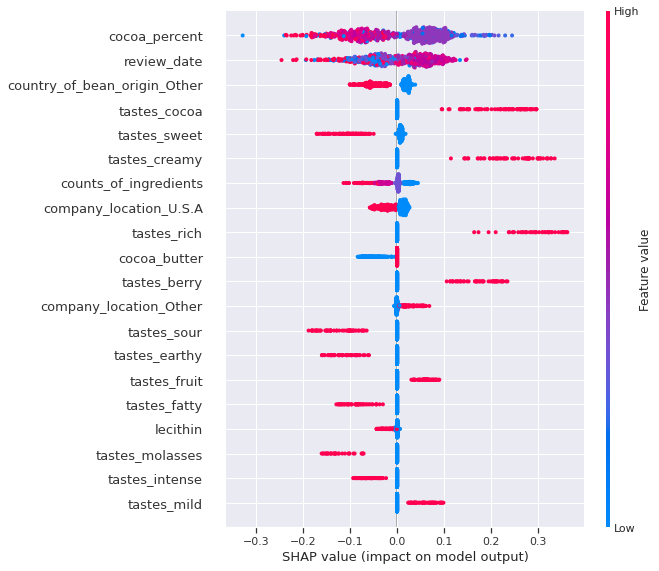

In [ ]:
np.random.seed(rand)
X_train_summary = shap.kmeans(X_train, 10)
shap_svm_explainer = shap.KernelExplainer(fitted_svm_mdl.predict_proba,\
                                          X_train_summary)
shap_svm_values_test = shap_svm_explainer.shap_values(X_test,\
                                nsamples=200, l1_reg="num_features(20)")
shap.summary_plot(shap_svm_values_test[1], X_test, plot_type="dot")

Le code précédent produit la sortie illustrée à la figure. Même si le point de ce chapitre est l'interprétation du modèle local, il est important de commencer par la forme globale de celui-ci pour s'assurer que les résultats sont intuitifs. S'ils ne le sont pas, peut-être que quelque chose ne va pas

Dans la figure nous pouvons dire que les pourcentages de cacao (rouge) les plus élevés (cacao_percent) ont tendance à être en corrélation avec une diminution de la probabilité de Hautement recommandé, mais les valeurs moyennes (violet) ont tendance à l'augmenter. Ce résultat est intuitif car les chocolats les plus noirs ont un goût plus acquis que les chocolats moins noirs.

 Les valeurs faibles (bleu) sont dispersées partout, de sorte qu'elles ne montrent aucune tendance, mais cela pourrait être dû au fait qu'il n'y en a pas beaucoup.
 
  D'un autre côté, la date d'examen suggère qu'il était susceptible d'être fortement recommandé dans les années précédentes. Il y a des nuances importantes de rouge et de violet des deux côtés de 0, il est donc difficile d'identifier une tendance ici. Un diagramme de dépendance, comme ceux utilisés au chapitre 5, Méthodes d'interprétation globales indépendantes du modèle, serait préférable à cette fin.
  
   Cependant, il est très facile pour les caractéristiques binaires de visualiser l'impact des valeurs hautes et basses, des uns et des zéros, sur le modèle. Par exemple, nous pouvons dire que la présence de goûts de cacao, de crémeux, de riche et de baies augmente la probabilité que le chocolat soit recommandé, tandis que les goûts sucrés, terreux, acides et gras font le contraire. De même, les chances d'être hautement recommandé diminuent si le chocolat a été fabriqué aux États-Unis ! Désolé, États-Unis

## Interprétation locale pour un groupe de prédictions à l'aide de diagrammes de décision

 La clé est de fournir un certain contexte pour comparer les points de manière adéquate, et il ne peut pas y en avoir tellement que vous ne puissiez pas les distinguer. Habituellement, vous trouverez des valeurs aberrantes ou uniquement celles qui répondent à des critères spécifiques. Pour cet exercice, nous sélectionnerons uniquement les barres qui ont été produites par votre client, comme suit

In [ ]:
sample_test_idx = X_test.index.\
                    get_indexer_for([5,6,7,18,19,21,24,25,27])

Une grande chose à propos de Shapley est sa propriété d'additivité, qui peut être facilement démontrée. Si vous ajoutez toutes les valeurs SHAP à la valeur attendue utilisée pour les calculer, vous obtenez une prédiction. Bien sûr, il s'agit d'un problème de classification, donc la prédiction est une probabilité ; ainsi, pour obtenir un tableau booléen à la place, nous devons vérifier si la probabilité est supérieure à 0,5. Nous pouvons vérifier si ce tableau booléen correspond aux prédictions de l'ensemble de données de test de notre modèle (y_test_svc_pred) en exécutant le code suivant


Il devrait, et il le fait ! Vous pouvez voir la confirmation iciIl devrait, et il le fait ! Vous pouvez voir la confirmation ici

In [ ]:
expected_value = shap_svm_explainer.expected_value[1]
y_test_shap_pred = (shap_svm_values_test[1].sum(1) + expected_value) > 0.5
print(np.array_equal(y_test_shap_pred, y_test_svc_pred))

True


Le diagramme de décision de SHAP est livré avec une fonction de surbrillance que nous pouvons utiliser pour faire ressortir les faux négatifs (FN). Maintenant, déterminons lesquelles de nos observations d'échantillon sont FN, comme suit

In [ ]:
FN = (~y_test_shap_pred[sample_test_idx]) &\
     (y_test.iloc[sample_test_idx] == 1).to_numpy() 

Nous pouvons maintenant réinitialiser rapidement notre style de traçage au style matplotlib par défaut et tracer un decision_plot. Il prend la valeur attendue, les valeurs SHAP et les valeurs réelles des éléments que nous souhaitons tracer. En option, nous pouvons fournir un tableau booléen des éléments que nous voulons mettre en évidence, avec des lignes pointillées, dans ce cas, les faux négatifs (FN), comme illustré dans l'extrait de code suivant

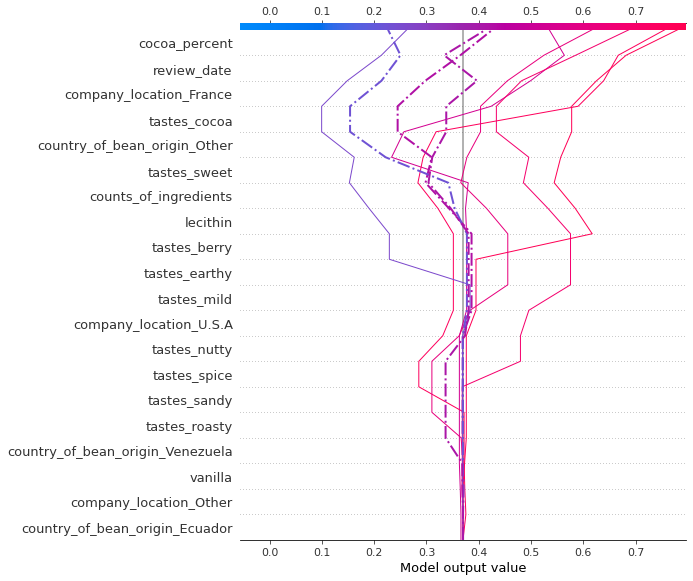

In [ ]:
sns.reset_orig()
plt.rcParams.update(orig_plt_params)
shap.decision_plot(expected_value, shap_svm_values_test[1][sample_test_idx],\
                   X_test.iloc[sample_test_idx], highlight=FN)

Le graphique produit à la figure a une seule ligne codée par couleur pour chaque observation. La couleur de chaque ligne ne représente pas la valeur d'une caractéristique, mais la sortie du modèle. Puisque nous avons utilisé predict_proba dans KernelExplainer, il s'agit d'une probabilité, mais sinon, les valeurs SHAP auraient été affichées, et la valeur qu'elles ont lorsqu'elles frappent l'axe x supérieur est la valeur prédite. 

Les caractéristiques sont triées en termes d'importance mais uniquement parmi les observations tracées, et vous pouvez dire que les lignes augmentent et diminuent horizontalement en fonction de chaque caractéristique. Dans quelle mesure ils varient et dans quelle direction dépendent de la contribution de la caractéristique au résultat. La ligne grise représente la valeur attendue de la classe, qui est comme l'interception dans un modèle linéaire. En fait, de même, toutes les lignes commencent à cette valeur, il est donc préférable de lire le tracé de bas en haut


Vous pouvez dire qu'il y a trois faux négatifs tracés dans la figure  parce qu'ils ont des lignes pointillées. En utilisant ce graphique, nous pouvons facilement visualiser quelles caractéristiques les ont fait virer le plus vers la gauche, car c'est ce qui a fait d'eux des prédictions négatives. Par exemple, nous savons que le moins de faux négatifs était à droite de la ligne de valeur attendue jusqu'à la lecithin , puis a continué à diminuer jusqu'à company_location_France, et review_date a augmenté sa probabilité d'être hautement recommandé, mais ce n'était pas suffisant. Vous pouvez dire que county_of_bean_origin_Other a diminué la probabilité de deux des erreurs de classification. 

Cette décision pourrait être injuste car le pays pourrait être l'un des plus de 50 pays qui n'ont pas obtenu leur propre fonctionnalité. Très probablement, il y a beaucoup de variation entre les fèves de ces pays regroupés



Les diagrammes de décision peuvent également isoler une seule observation. Lorsqu'il le fait, il imprime la valeur de chaque caractéristique à côté de la ligne pointillée. Traçons un graphique pour un graphique de décision de la même entreprise (observation vraie positive #696), comme suit

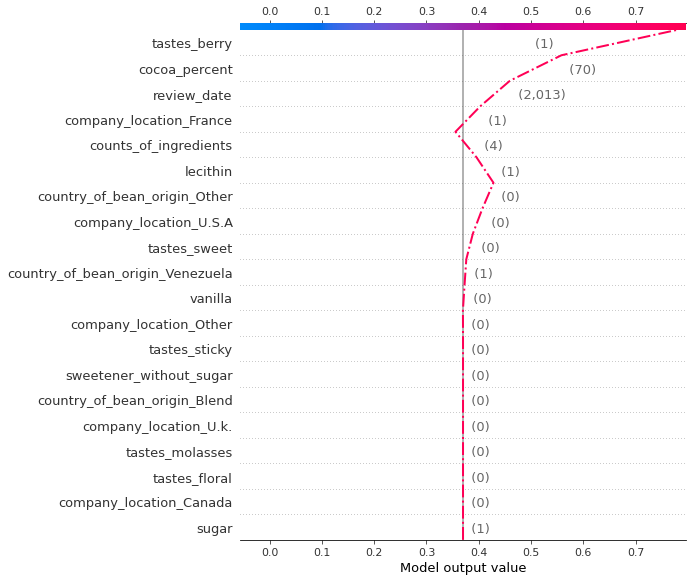

In [ ]:
shap.decision_plot(expected_value, shap_svm_values_test[1][696],\
                   X_test.iloc[696], highlight=0)

Dans la figure vous pouvez voir que la lécithine et counts_of_ingredients ont réduit la probabilité hautement recommandée à un point où elle aurait pu la compromettre. Heureusement, toutes les caractéristiques au-dessus de celles-ci ont décidément viré à droite car company_location_France=1, Cocoa_percent=70 et tastes_berry=1 sont toutes favorables

## Interprétation locale pour une seule prédiction à la fois à l'aide d'un tracé de force 

Votre client, le fabricant de chocolat, a deux barres qu'il souhaite que vous compariez. Le bar n°5 est exceptionnel et le n°24 est décevant. Ils sont tous les deux dans votre ensemble de données de test. Une façon de les comparer est de placer leurs valeurs côte à côte dans une base de données pour comprendre en quoi elles diffiérent exactement. Nous allons concaténer la note, l'étiquette réelle y et l'étiquette prédite y_pred aux valeurs de ces observations, comme suit

In [ ]:
eval_idxs = (X_test.index==5) | (X_test.index==24)
X_test_eval = X_test[eval_idxs]
eval_compare_df = pd.concat([\
            chocolateratings_df.iloc[X_test[eval_idxs].index].rating,\
            pd.DataFrame({'y':y_test[eval_idxs]}, index=[5,24]),\
            pd.DataFrame({'y_pred':y_test_svc_pred[eval_idxs]},\
                         index=[24,5]),
            X_test_eval], axis=1).transpose()
eval_compare_df

,5,24
rating,4.0,2.75
y,1.0,0.00
y_pred,1.0,0.00
review_date,2013.0,2015.00
cocoa_percent,70.0,70.00
counts_of_ingredients,4.0,4.00
cocoa_butter,1.0,1.00
vanilla,0.0,0.00
lecithin,1.0,1.00
salt,0.0,0.00


Le code précédent produit la trame de données illustrée au tableau . Avec cette trame de données, vous pouvez conrmer qu'il ne s'agit pas d'erreurs de classification car y=y_pred. Une mauvaise classification pourrait rendre les interprétations des modèles peu fiables pour comprendre pourquoi les gens ont tendance à aimer une barre chocolatée plus qu'une autre. Ensuite, vous pouvez examiner les caractéristiques pour repérer les différences. Par exemple, vous pouvez dire que la date de révision est distante de 2 ans. De plus, les grains de la barre exceptionnelle venaient du Venezuela et les grains décevants venaient d'un autre pays moins représenté. L'exceptionnel avait un goût de baies et le décevant était terreux


Le diagramme de force peut nous raconter une histoire complète de ce qui a pesé dans les décisions du modèle (et, vraisemblablement, celles des examinateurs), et nous donne des indices sur ce que les consommateurs pourraient préférer. Tracer un force_plot nécessite la valeur attendue pour la classe de votre intérêt (expected_value), les valeurs SHAP pour l'observation de votre intérêt et les valeurs réelles de cette observation. Nous allons commencer par l'observation n°5, comme illustré dans l'extrait de code suivant

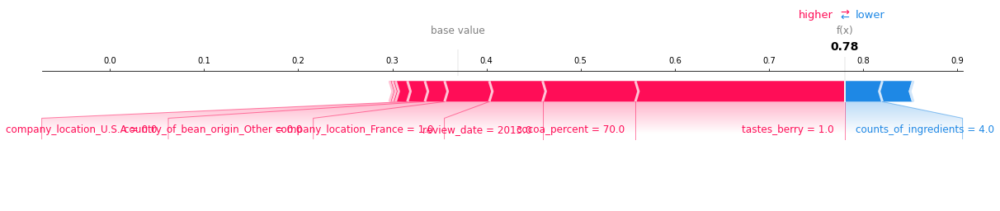

In [ ]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==5],\
                X_test[X_test.index==5],  matplotlib=True)

Le code précédent produit le tracé illustré à la figure. Ce graphique de force représente combien review_date, cacao_percent et tastes_berry pèsent dans la prédiction, tandis que la seule caractéristique qui semble peser dans la direction opposée est counts_of_ingredients


Comparons-le avec un tracé de force de l'observation #24, comme suit

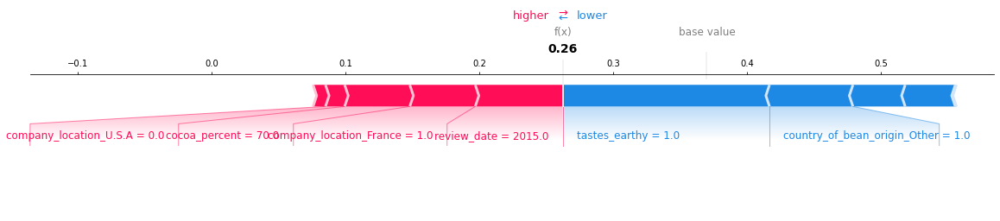

In [ ]:
shap.force_plot(expected_value, shap_svm_values_test[1][X_test.index==24],\
                X_test[X_test.index==24], matplotlib=True)

Le code précédent produit le tracé illustré à la figure . Nous pouvons facilement dire que tastes_earthy  et country_of_bean_origin_Other sont considérés comme des attributs très négatifs par notre modèle. Le résultat pourrait s'expliquer principalement par la différence dans la dégustation du chocolat « baies » par rapport à « terreux ». Malgré nos découvertes, le pays d'origine des fèves doit faire l'objet d'une enquête plus approfondie. Après tout, il est possible que le pays d'origine réel ne corresponde pas à de mauvaises notes


Dans cette section, nous avons couvert le KernelExplainer, qui utilise quelques astuces apprises de LIME. Mais qu'est-ce que la LIME ? Nous le découvrirons ensuite !

## En utilisant LIMEU 

jusqu'à présent, les méthodes d'interprétation indépendantes du modèle que nous avons couvertes tentent de réconcilier la totalité des sorties d'un modèle avec ses entrées. Pour que ces méthodes aient une bonne idée de comment et pourquoi X devient y_pred, elles ont d'abord besoin de quelques données. 

Ensuite, ils effectuent des simulations avec ces données, en insérant des variations et en évaluant ce qui sort du modèle. Parfois, ils tirent même parti d'un substitut mondial pour relier les points. 

En utilisant ce qu'ils ont appris au cours de ce processus, ils génèrent des importances, des scores, des règles ou des valeurs qui quantifient l'impact, les interactions ou les décisions d'une fonctionnalité au niveau global. Pour de nombreuses méthodes telles que SHAP, celles-ci peuvent également être observées localement. Cependant, même lorsqu'il peut être observé localement, ce qui a été quantifié globalement peut ne pas s'appliquer localement.

 Pour cette raison, il devrait y avoir une autre approche qui quantifie les effets locaux des caractéristiques uniquement pour l'interprétation locale, une telle que LIME !

## Qu'est-ce que LIME ? 

LIME forme des substituts locaux pour expliquer une seule prédiction. Pour cela, il commence par vous demander quel point de données vous souhaitez interpréter. Vous lui fournissez également votre modèle de boîte noire et un exemple de jeu de données. Il fait ensuite des prédictions sur une version perturbée de l'ensemble de données avec le modèle, créant un schéma dans lequel il échantillonne et pèse les points plus haut s'ils sont plus proches du point de données choisi. 


Cette zone autour de votre point est appelée un voisinage. Ensuite, en utilisant les points échantillonnés et les prédictions de la boîte noire dans ce voisinage, il forme un modèle de substitution pondéré intrinsèquement interprétable. Enfin, il interprète le modèle de substitution. 

Il y a beaucoup de mots-clés à décompresser ici, alors définissons-les comme suit : 


• Point de données choisi : LIME appelle le point de données, la ligne ou l'observation que vous souhaitez interpréter pour une instance. C'est juste un autre mot pour ce concept.

* Perturbation : LIME simule de nouveaux échantillons en perturbant chaque caractéristique en s'inspirant de sa distribution de jeu de données d'apprentissage pour les caractéristiques catégorielles et de la distribution normale pour les caractéristiques continues.

* Schéma de pondération : LIME utilise un noyau de lissage exponentiel pour à la fois  ne le rayon du voisinage et déterminer comment peser les points les plus éloignés par rapport à ceux les plus proches


* Plus proche : LIME utilise la distance euclidienne pour les données tabulaires et les images, et la similarité en cosinus pour le texte. C'est difficile à imaginer dans les espaces de caractéristiques de grande dimension, mais vous pouvez calculer la distance entre les points pour un nombre quelconque de dimensions et trouver quels points sont les plus proches de celui d'intérêt.

* Modèle de substitution intrinsèquement interprétable : LIME utilise un modèle avec régularisation des crêtes pondérées. Cependant, il pourrait utiliser n'importe quel modèle intrinsèquement interprétable tant que les points de données peuvent être pondérés. L'idée derrière cela est double. Il a besoin d'un modèle capable de fournir des paramètres intrinsèques fiables tels que des coefficients qui lui indiquent à quel point chaque caractéristique a un impact sur la prédiction. Il doit également prendre davantage en compte les points de données les plus proches du point choisi, car ils sont plus pertinents


Tout comme avec les k-Nearest Neighbors (k-NN), l'intuition derrière LIME est que les points d'un voisinage ont des points communs car on peut s'attendre à ce que les points proches les uns des autres aient des étiquettes similaires, voire identiques. Il existe des limites de décision pour les classificateurs, donc cela pourrait être une hypothèse très naïve à faire lorsque des points proches sont divisés par un. et pèse les points en conséquence, bien qu'il le fasse de manière exponentielle. 


Cependant, LIME n'est pas une classe de modèle mais une méthode d'interprétation, donc les similitudes s'arrêtent là. Au lieu de "voter" pour des prédictions entre voisins, il s'agit d'un modèle linéaire clairsemé de substitution pondéré car il suppose que chaque modèle complexe est linéaire localement, et parce qu'il ne s'agit pas d'une classe de modèle, les prédictions faites par le modèle de substitution n'ont pas d'importance. 

En fait, le modèle de substitution n'a même pas besoin d'adapter les données comme un gant, car tout ce dont vous avez besoin, ce sont les coecients. Bien sûr, cela étant dit, il est préférable que cela se passe bien pour qu'il y ait une plus grande fidélité dans l'interprétation. LIME fonctionne pour les données tabulaires, image et texte et a généralement une haute fidélité locale, ce qui signifie qu'il peut se rapprocher de la le modèle prédit assez bien au niveau local. Cependant, cela dépend de la définition correcte du voisinage, qui découle du choix de la bonne largeur de noyau et de l'hypothèse de linéarité locale qui est vraie

## Interprétation locale pour une seule prédiction à la fois en utilisant Lime TabularExplainer

Pour expliquer une seule prédiction, vous instanciez d'abord un LimeTabularExplainer en lui fournissant votre exemple de jeu de données dans un tableau NumPy 2D (X_test.values), une liste avec les noms des fonctionnalités .columns), une liste avec les indices des caractéristiques catégorielles (seules les trois premières caractéristiques ne sont pas catégorielles), et les noms de classe. Même si seul l'exemple de jeu de données est requis, il est recommandé de fournir des noms pour vos entités et classes afin que l'interprétation ait un sens. 


Pour les données tabulaires, il est important de dire à LIME quelles caractéristiques sont catégorielles (categorical_features) car il traite les caractéristiques catégorielles différemment des caractéristiques continues, et ne pas le spécifier pourrait potentiellement créer un substitut local mal ajusté. kernel_width est un autre paramètre qui peut avoir un impact considérable sur le substitut local. 

Cela dénit le diamètre du voisinage, répondant ainsi à la question de ce qui est considéré comme local. Il a une valeur par défaut, qui peut ou non donner des interprétations qui ont du sens pour votre instance. Vous pouvez régler ce paramètre instance par instance pour optimiser vos explications. Le code peut être vu dans l'extrait suivant

In [ ]:
lime_svm_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,\
                        feature_names=X_test.columns, categorical_features=list(range(3,44)),\
                        class_names=['Not Highly Recomm.', 'Highly Recomm.'])

Avec l'explicateur instancié, vous pouvez maintenant utiliser Explain_instance pour adapter un modèle de substitution local à l'observation n°5. Nous utiliserons également la fonction classifieur de notre modèle (predict_proba) et limiterons notre nombre de fonctionnalités à huit (num_features=8). On peut prendre "l'explication" renvoyée et la visualiser immédiatement avec show_in_notebook. Dans le même temps, le paramètre predict_proba s'assure qu'il inclut également un graphique pour montrer quelle classe est la plus probable, selon le modèle de substitution local. Le code est illustré dans l'extrait suivant

In [ ]:
lime_svm_explainer.explain_instance(X_test[X_test.index==5].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

Le code précédent fournit la sortie illustrée à la Figure. Selon le substitut local, une valeur cacao_percent inférieure ou égale à 70 est un attribut favorable, tout comme le goût des baies. Un manque de goûts aigre, sucré et de mélasse pèse également favorablement dans ce modèle. Cependant, un manque de goûts riches, crémeux et de cacao fait le contraire, mais pas assez pour pousser la balance vers Pas fortement recommandé


Avec un petit ajustement au code qui a produit la figure, nous pouvons produire le même graphique mais pour l'observation #24, comme suit

In [ ]:
lime_svm_explainer.explain_instance(X_test[X_test.index==24].values[0],\
                                    fitted_svm_mdl.predict_proba,\
                                    num_features=8).\
                                show_in_notebook(predict_proba=True)

Une fois que vous comparez l'explication de #24 avec celle de #5 (Figure 6.10), les problèmes deviennent évidents. Une seule caractéristique, tastes_berry, est ce qui différencie les deux explications. Bien sûr, nous l'avons limité aux huit principales fonctionnalités, il y a donc probablement beaucoup plus que cela. Cependant, vous vous attendez à ce que les huit principales fonctionnalités incluent celles qui font le plus de différence.


Selon SHAP, savoir que goûts_terre=1 est ce qui explique globalement le caractère décevant de la barre chocolatée #24, mais cela semble contre-intuitif. Alors, qu'est-ce-qu'il s'est passé? Il s'avère que les observations #5 et #24 sont relativement similaires et donc dans le même quartier. Ce quartier comprend également de nombreuses barres chocolatées aux saveurs de petits fruits, et très peu aux saveurs terreuses. Cependant, il n'y a pas assez d'éléments terreux pour le considérer comme une caractéristique saillante, il attribue donc la différence entre fortement recommandé et pas fortement recommandé à d'autres caractéristiques qui semblent se différencier plus souvent, au moins localement. La raison à cela est double : le voisinage local pourrait être trop petit et les modèles linéaires, étant donné leur simplicité, se situent du côté du biais d'un compromis biais-variance. Ce biais n'est qu'exacerbé par le fait que certaines caractéristiques telles que les goûts_berry peuvent apparaître relativement plus souvent que les goûts_terrestres. Il existe une approche que nous pouvons utiliser pour résoudre ce problème, et nous le couvrirons dans la section suivante

## Utilisation de LIME pour la PNL

Au début du chapitre, nous avons mis de côté les ensembles de données d'entraînement et de test avec le contenu nettoyé de toutes les colonnes « goûts » pour la PNL. Nous pouvons jeter un œil à l'ensemble de données de test pour la PNL, comme suit :

In [ ]:
print(X_test_nlp)

1194                 roasty nutty rich
77      roasty oddly sweet marshmallow
121              balanced cherry choco
411                sweet floral yogurt
1259           creamy burnt nuts woody
                     ...              
327          sweet mild molasses bland
1832          intense fruity mild sour
464              roasty sour milk note
2013           nutty fruit sour floral
1190           rich roasty nutty smoke
Length: 734, dtype: object


Aucun modèle d'apprentissage automatique ne peut ingérer les données sous forme de texte, nous devons donc les transformer en un format numérique, en d'autres termes, les vectoriser. Il existe de nombreuses techniques que nous pouvons utiliser pour ce faire. Dans notre cas, nous ne nous intéressons pas à la position des mots dans chaque phrase, ni à la sémantique. Cependant, nous nous intéressons à leur occurrence relative—après tout, c'était un problème pour nous dans la dernière section. Pour ces raisons, Term Frequency-Inverse Document Frequency (TF-IDF) est la méthode idéale car elle est destinée à évaluer la fréquence à laquelle un terme (chaque mot) apparaît dans un document (chaque phrase).

 Cependant, il est pondéré en fonction de sa fréquence dans l'ensemble du corpus (toutes les phrases). Nous pouvons facilement vectoriser nos jeux de données en utilisant la méthode TF-IDF avec TfidfVectorizer de scikit-learn. Cependant, lorsque vous devez créer des scores TD-IDF, ceux-ci sont ajustés à l'ensemble de données d'apprentissage uniquement, car de cette façon, les ensembles de données d'entraînement et de test transformés ont un score cohérent pour chaque terme. Jetez un œil à l'extrait de code suivant

In [ ]:
vectorizer = TfidfVectorizer(lowercase=False)
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

Pour avoir une idée de ce à quoi ressemble le score TF-IDF, nous pouvons placer tous les noms de caractéristiques dans une colonne d'une base de données et leurs scores respectifs pour une seule observation dans une autre. Notez que puisque le vectoriseur produit une matrice scipy sparse, nous devons la convertir en une matrice NumPy avec todense() puis un tableau NumPy avec asarray(). Nous pouvons trier cette trame de données par ordre décroissant selon les scores TD-IDF. Le code est affiché dans l'extrait suivant

In [ ]:
pd.DataFrame({'taste':vectorizer.get_feature_names(),\
              'tf-idf': np.asarray(X_test_nlp_fit[X_test_nlp.index==5].todense())[0]}).\
    sort_values(by='tf-idf', ascending=False)

,taste,tf-idf
305,raspberry,0.585538
259,nut,0.491542
265,oily,0.463973
64,caramel,0.447504
274,papaya,0.000000
...,...,...
136,empty,0.000000
135,edge,0.000000
134,easy,0.000000
133,easter,0.000000


Et comme vous pouvez le voir sur la figure, les scores TD-IDF sont des valeurs normalisées entre 0 et 1, et les plus courantes dans le corpus ont une valeur inférieure. Chose intéressante, nous réalisons que l'observation n°5 dans notre ensemble de données tabulaires avait berry=1 à cause de la framboise. La méthode de codage catégorique que nous avons utilisée a recherché les occurrences de berry, qu'elles correspondent ou non à un mot entier. Ce n'est pas un problème car la framboise est une sorte de baie, et la framboise n'était pas l'un de nos goûts communs avec sa propre colonne binaire. Maintenant que nous avons vectorisé nos jeux de données PNL, nous pouvons procéder à la modélisation

## Entraîner un modèle LightGBM

LightGBM, comme XGBoost, est un autre framework d'amplification de gradient très populaire et performant qui exploite des ensembles d'arbres optimisés et un split nding basé sur l'histogramme. 

Les principales différences résident dans les algorithmes de la méthode de division, qui pour LightGBM utilise l'échantillonnage avec un échantillonnage unilatéral basé sur le gradient (GOSS) et le regroupement de fonctionnalités clairsemées avec Exclusive Feature Bundling (EFB) par rapport à XGBoost Weighted Quantile Sketch and Sparsity. au courant Split Finding. Une autre différence réside dans la façon dont les arbres sont construits, qui est d'abord en profondeur (de haut en bas) pour XGBoost et en premier (à travers les feuilles d'un arbre) pour LightGBM. Nous n'entrerons pas dans les détails du fonctionnement de ces algorithmes car cela ferait dérailler le sujet en question. 


Cependant, il est important de noter que grâce à GOSS, LightGBM est généralement encore plus rapide que XGBoost, et bien qu'il puisse perdre des performances prédictives en raison des approximations de division de GOSS, il en récupère une partie avec sa meilleure approche. D'autre part, Explainable Boosting Machine (EBM) rend LightGBM idéal pour s'entraîner sur des fonctionnalités clairsemées de manière efficace et efficiente, telles que celles de notre matrice X_train_nlp_fit sparse ! Cela résume à peu près pourquoi nous utilisons LightGBM pour cet exercice


Pour entraîner le modèle LightGBM, nous initialisons d'abord le modèle en fixant la profondeur maximale de l'arbre (max_depth), le taux d'apprentissage (learning_rate), le nombre d'arbres boostés à t (n_estimators), l'objectif, qui est la classification binaire , et – last but not least – le random_state pour la reproductibilité. Avec fit, nous entraînons le modèle à l'aide de notre ensemble de données d'entraînement PNL vectorisé (X_train_nlp_fit) et des mêmes étiquettes utilisées pour le modèle SVM (y_train). Une fois entraînés, nous pouvons évaluer à l'aide de l'évaluate_class_mdl que nous avons utilisé avec SVM. Le code est illustré dans l'extrait suivant

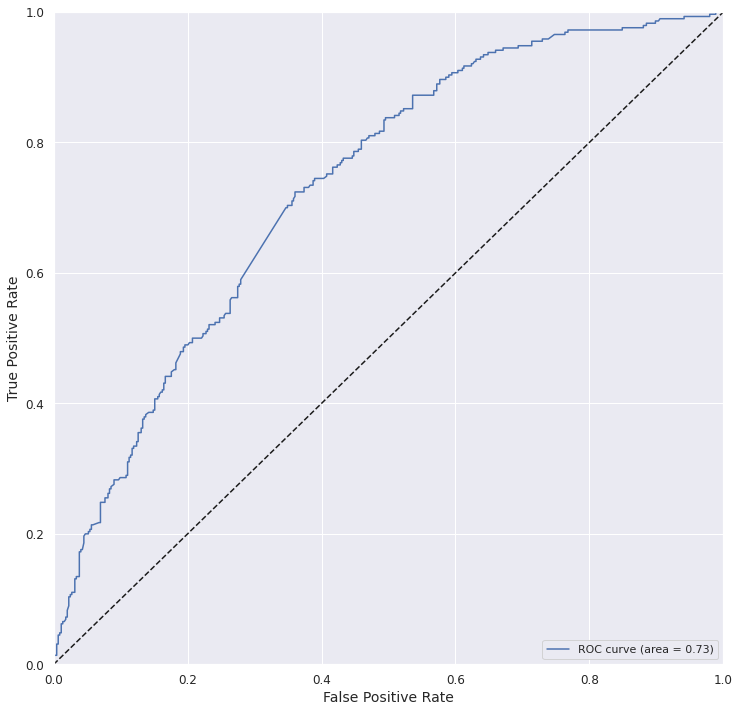

Accuracy_train:  0.7953		Accuracy_test:   0.6798
Precision_test:  0.6233		Recall_test:     0.4793
ROC-AUC_test:    0.7328		F1_test:         0.5419		MCC_test: 0.3084


In [ ]:
sns.set()
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05,\
            n_estimators=100, objective='binary', random_state=rand)
fitted_lgb_mdl = lgb_mdl.fit(X_train_nlp_fit, y_train)
y_train_lgb_pred, y_test_lgb_prob, y_test_lgb_pred =\
    mldatasets.evaluate_class_mdl(fitted_lgb_mdl, X_train_nlp_fit,\
                                  X_test_nlp_fit, y_train, y_test)

Les performances atteintes par LightGBM ont légèrement inférieures à celles de SVM mais elles restent assez bonnes, en toute sécurité au-dessus de la ligne de tirage au sort. Les commentaires pour SVM sur la préférence pour la précision par rapport au rappel pour ce modèle s'appliquent également ici

## Interprétation locale pour une seule prédiction à la fois à l'aide de LimeTextExplainer 

le voisinage de votre instance, puis entraînez un modèle linéaire avec. L'instance doit être sous sa forme numérique, c'est-à-dire vectorisée. Cependant, ce serait plus facile si vous pouviez fournir n'importe quel texte arbitraire, et il pourrait ensuite le vectoriser à la volée. C'est précisément ce qu'un pipeline peut faire pour vous. Avec la fonction make_pipeline de scikit-learn, vous pouvez définir une séquence d'estimateurs qui transforment les données, suivi d'un autre qui peut les adapter. Dans ce cas, nous avons juste besoin de vectoriser pour transformer nos données, suivi de notre modèle LightGBM (lgb_mdl) qui prend les données transformées, comme illustré dans l'extrait de code suivant

In [ ]:
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)

L'initialisation d'un LimeTextExplainer est assez simple. Tous les paramètres sont facultatifs, mais il est recommandé de spécifier des noms pour vos classes. Tout comme avec LimeTabularExplainer, un paramètre facultatif kernel_width peut être critique car il dénit la taille du quartier, et il existe une valeur par défaut qui peut ne pas être optimale mais qui peut être ajustée instance par instance. Le code est illustré ici

In [ ]:
lime_lgb_explainer = LimeTextExplainer(class_names=['Not Highly Recomm.', 'Highly Recomm.'])

Expliquer une instance avec LimeTextExplainer est similaire à le faire pour LimeTabularExplainer. La différence est que nous utilisons un pipeline (lgb_pipeline), et les données que nous fournissons (premier paramètre) sont du texte puisque le pipeline peut les transformer pour nous. Le code est illustré dans l'extrait suivant

In [ ]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==5].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

Selon l'explicateur de texte LIME, le modèle LightGBM prédit Hautement recommandé pour l'observation n°5 à cause du mot caramel. Au moins selon le quartier local, la framboise n'est pas un facteur


Comparons maintenant l'interprétation de l'observation #5 avec celle de la #24, comme nous l'avons fait auparavant. Nous pouvons utiliser le même code mais simplement remplacer 5 par 24, comme suit

In [ ]:
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==24].values[0],\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)


Selon la figure , vous pouvez dire que l'observation n°24, décrite comme ayant un goût de choco terreux de bois brûlé, n'est pas fortement recommandée en raison des mots terreux et brûlé. 

Étant donné que nous utilisons un pipeline qui peut vectoriser n'importe quel texte arbitraire, amusons-nous avec ça ! Nous allons d'abord essayer une phrase composée d'adjectifs que nous soupçonnons que notre modèle favorise, puis en essayer une avec des adjectifs défavorables, et enfin essayer d'utiliser des mots avec lesquels notre modèle ne devrait pas être familier, comme suit

In [ ]:
lime_lgb_explainer.explain_instance('creamy rich complex fruity',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('sour bitter roasty molasses',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)
lime_lgb_explainer.explain_instance('nasty disgusting gross stuff',\
                                    lgb_pipeline.predict_proba, num_features=4).\
                                    show_in_notebook(text=True)

Dans la figure , les explications sont précises pour la mélasse rôtie crémeuse riche complexe fruitée et aigre amère puisque le modèle sait que ces mots sont soit très favorables, soit défavorables. Ces mots sont également assez communs pour être appréciés au niveau local


Cependant, vous auriez tort de penser que la prédiction de Pas hautement recommandé pour des trucs grossiers dégoûtants et dégoûtants a quelque chose à voir avec les mots. Le modèle LightGBM n'a jamais vu ces mots auparavant, donc la prédiction a plus à voir avec le fait que Non fortement recommandé est la classe majoritaire, ce qui est une bonne estimation, et la matrice clairsemée pour cette phrase est entièrement composée de zéros. Par conséquent, LIME a probablement trouvé peu de points distants, voire aucun, dans son voisinage, de sorte que les coefficients zéro du modèle de substitution local de LIME reflètent cela.

## Essayer SHAP pour NLP

La plupart des explicateurs de SHAP fonctionneront avec des données tabulaires. DeepExplainer peut faire du texte mais est limité aux modèles d'apprentissage en profondeur, et, comme nous le verrons au chapitre 8, Visualiser les réseaux de neurones convolutifs, trois d'entre eux font des images, y compris KernelExplainer. En fait, KernelExplainer de SHAP a été conçu pour être une méthode à usage général véritablement indépendante des modèles, mais il n'est pas présenté comme une option pour la PNL. 

Il est facile de comprendre pourquoi : c'est lent, et les modèles NLP ont tendance à être très complexes et avec des centaines, voire des milliers, de fonctionnalités pour démarrer. Dans des cas comme celui-ci, où l'ordre des mots n'est pas un facteur et vous avez quelques centaines de fonctionnalités, mais les 100 premières sont présentes dans la plupart de vos observations, KernelExplainer pourrait fonctionner


En plus de surmonter la lenteur, vous devrez surmonter quelques obstacles techniques. L'un d'eux est que KernelExplainer est compatible avec un pipeline, mais il attend un seul ensemble de prédictions en retour. Mais LightGBM renvoie deux ensembles, un pour chaque classe : Pas hautement recommandé et Hautement recommandé. Pour surmonter ce problème, nous pouvons créer une fonction lambda (predict_fn) qui inclut une fonction predict_proba, qui renvoie uniquement ces prédictions pour Hautement recommandé. Ceci est illustré dans l'extrait de code suivant :

In [ ]:
predict_fn = lambda X: lgb_mdl.predict_proba(X)[:,1]

Le deuxième obstacle technique concerne l'incompatibilité de SHAP avec les matrices clairsemées de SciPy, et pour notre explicatif, nous aurons besoin d'échantillons de données de test vectorisées, qui sont dans ce format. Pour surmonter ce problème, nous pouvons convertir nos données au format SciPy sparse-matrix en une matrice NumPy, puis en une trame de données pandas (X_test_nlp_samp_df). Pour surmonter toute lenteur, nous pouvons utiliser la même astuce de kmeans que nous avons utilisée la dernière fois. Hormis les ajustements effectués pour surmonter les obstacles, le code suivant est exactement le même qu'avec SHAP réalisé avec le modèle SVM


  0%|          | 0/50 [00:00<?, ?it/s]

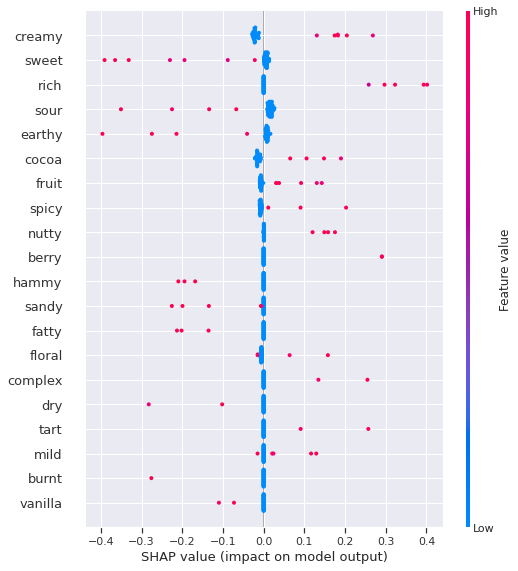

In [ ]:
X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())
shap_lgb_explainer = shap.KernelExplainer(predict_fn,\
                            shap.kmeans(X_train_nlp_fit.todense(), 10))
shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,\
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,\
            plot_type="dot", feature_names=vectorizer.get_feature_names())

En utilisant le graphique récapitulatif de SHAP sur la figure , vous pouvez dire que globalement les mots crémeux, riche, cacao, fruit, épicé, noisette et baie ont un impact positif sur le modèle pour prédire Hautement recommandé. D'autre part, le sucré, l'acide, le terreux, le jambon, le sable et le gras ont l'effet inverse. Ces résultats ne devraient pas être tout à fait inattendus compte tenu de ce que nous avons appris avec notre modèle SVM précédent avec les données tabulaires et les interprétations LIME locales. Cela étant dit, les valeurs SHAP ont été dérivées d'échantillons d'une matrice clairsemée, et elles pourraient manquer de détails et peut-être même être partiellement incorrectes, en particulier pour les caractéristiques sous-représentées. Par conséquent, nous devons prendre les conclusions avec un grain de sel, surtout vers la moitié inférieure de l'intrigue. Pour augmenter la fidélité de l'interprétation, il est préférable d'augmenter la taille de l'échantillon, mais étant donné la lenteur de KernelExplainer, il y a un compromis à considérer


Maintenant que nous avons validé nos valeurs SHAP globalement, nous pouvons les utiliser pour une interprétation locale avec un tracé de force. Contrairement à LIME, nous ne pouvons pas utiliser de données arbitraires pour cela. Avec SHAP, nous sommes limités aux points de données pour lesquels nous avons précédemment généré des valeurs SHAP. Par exemple, prenons la 18e observation de notre échantillon de jeu de données de test, comme suit

In [ ]:
print(shap.sample(X_test_nlp, 50).to_list()[18])

woody earthy medicinal


Il est important de noter quels mots sont représentés dans la 18e observation car la trame de données X_test_nlp_samp_df contient la représentation vectorisée. La 18e ligne d'observation dans cette base de données est ce que vous utilisez pour générer le tracé de la force, ainsi que les valeurs SHAP pour cette observation et la valeur attendue pour la classe, comme illustré dans l'extrait de code suivant

In [ ]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[18,:], 
                X_test_nlp_samp_df.iloc[18,:], feature_names=vectorizer.get_feature_names())

La figure est le diagramme de force pour les plantes médicinales ligneuses et terreuses. Comme vous pouvez le constater, le terreux et le boisé pèsent lourd dans une prédiction contre Hautement recommandé. Le mot médicinal n'est pas présenté dans l'intrigue de force et à la place, vous obtenez un manque de crème et de cacao comme facteurs négatifs. Comme vous pouvez l'imaginer, médicinal n'est pas un mot souvent utilisé pour décrire les barres de chocolat, il n'y avait donc qu'une seule observation dans l'ensemble de données échantillonné qui l'incluait. Par conséquent, sa contribution marginale moyenne à travers les coalitions possibles serait considérablement diminuée

Essayons-en un autre, comme suit

In [ ]:
print(shap.sample(X_test_nlp, 50).to_list()[9])

La 9ème observation est la phrase suivante

In [ ]:
intense spicy floral

SyntaxError: ignored

La génération d'un force_plot pour cette observation est la même qu'avant, sauf que vous remplacez 18 par 9. Si vous exécutez ce code, vous produisez la sortie illustrée ici dans la figure 

In [ ]:
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[9,:], 
                X_test_nlp_samp_df.iloc[9,:], feature_names=vectorizer.get_feature_names())

Comme vous pouvez le constater sur la figure, tous les mots de la phrase sont présentés dans le diagramme de force : oral et épicé poussant vers Hautement recommandé, et intense vers Pas fortement recommandé. Alors, maintenant que vous savez comment effectuer des interprétations tabulaires et PNL avec SHAP, comment cela se compare-t-il à LIME ?

## En comparant SHAP aux LIMEA

vous l'aurez déjà remarqué, SHAP et LIME ont tous deux des limites, mais ils ont aussi des atouts. SHAP est fondé sur la théorie des jeux et les valeurs approximatives de Shapley, donc ses valeurs SHAP signifient quelque chose. Ceux-ci ont de grandes propriétés telles que l'additivité, l'ecacité et la substituabilité qui le rendent cohérent mais violent la propriété factice. Il s'additionne toujours et n'a pas besoin de réglage de paramètre pour accomplir cela.


 Cependant, il est plus adapté aux interprétations globales, et l'un de ses explicateurs les plus indépendants du modèle, KernelExplainer, est douloureusement lent. KernelExplainer traite également les valeurs manquantes en utilisant des valeurs aléatoires, ce qui peut donner trop de poids aux observations improbables. LIME est rapide, très indépendant du modèle et adaptable à toutes sortes de données. Cependant, il n'est pas fondé sur des principes stricts et cohérents, mais a l'intuition que les voisins se ressemblent. Pour cette raison, cela peut nécessiter un réglage délicat des paramètres pour définir la taille du voisinage de manière optimale, et même dans ce cas, cela ne convient qu'aux interprétations locales.

## Mission accomplie

la mission était de comprendre pourquoi l'un des bars de votre client est exceptionnel alors qu'un autre est décevant. Votre approche a utilisé l'interprétation de modèles d'apprentissage automatique pour arriver aux conclusions suivantes : 

* Selon SHAP sur le modèle tabulaire, la barre exceptionnelle doit cette note à son goût de baies et à son pourcentage de cacao de 70 %. D'un autre côté, la note défavorable pour la barre Décevant est principalement due à sa saveur terreuse et au pays d'origine des haricots (Autre). La date d'examen joue un rôle moins important, mais il semble que les barres chocolatées examinées au cours de cette période (2013-15) aient été avantagées. 

* LIME confirme que coco_percent<=70 est une propriété souhaitable, et que, en plus des baies, crémeux, cacao et riche sont des goûts favorables, tandis que le sucré, l'aigre et la mélasse sont défavorables.

* Les points communs entre les deux méthodes l'utilisation du modèle tabulaire est que malgré les nombreux attributs non liés au goût, les caractéristiques gustatives sont parmi les plus saillantes. Par conséquent, il est juste d'interpréter les mots utilisés pour décrire chaque barre de chocolat via un modèle PNL. 

* La barre exceptionnelle était représentée par l'expression huile de noix caramel framboise, dont, selon LIMETextExplainer, le caramel est positif et huileux est négatif. Les deux autres mots sont neutres. En revanche, la barre Décevant était représentée par du bois brûlé choco terreux, dont le brûlé et le terreux sont défavorables et les deux autres sont favorables.
* Les incohérences entre les goûts dans les interprétations tabulaires et PNL sont dues à la présence de goûts moins représentés, dont la framboise, qui n'est pas aussi courante que la baie. 

* Selon l'explication globale de SHAP du modèle PNL, crémeux, riche, cacao, fruit, épicé, noisette et baies ont un impact positif sur le modèle pour prédire Hautement recommandé. D'autre part, le sucré, l'acide, le terreux, le jambon, le sable et le gras ont l'effet inverse.



Avec ces notions sur les caractéristiques et les goûts des barres chocolatées considérés comme moins attrayants par les membres de la Manhattan Chocolate Society, un client peut appliquer des modifications à ses formules de barres chocolatées pour attirer un public plus large, c'est-à-dire si l'hypothèse est correcte concernant ce groupe. étant représentatifs de leur public cible.



On pourrait faire valoir qu'il est assez évident que des mots tels que terreux et brûlé ne sont pas des mots favorables à associer aux barres de chocolat, alors que le caramel l'est. Par conséquent, nous aurions pu arriver à cette conclusion sans apprentissage automatique ! Mais tout d'abord, une conclusion non informée par des données aurait été une opinion, et, deuxièmement, le contexte est tout. De plus, on ne peut pas toujours compter sur les humains pour placer objectivement un point dans son contexte, d'autant plus qu'il se trouve parmi des milliers d'enregistrements ! 


De plus, l'interprétation d'un modèle local ne concerne pas seulement l'explication d'une prédiction, car elle est liée à la façon dont un modèle fait tout. prédictions mais, plus important encore, à la façon dont il fait des prédictions pour des points similaires, en d'autres termes, dans le voisinage local ! Dans le chapitre suivant, nous développerons ce que signifie être dans le quartier local en examinant les points communs (ancrages) et les incohérences (contrefactuels) que nous pouvons y trouver.